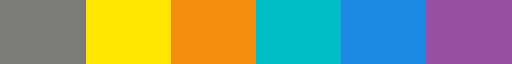

In [1]:
import numpy as np
import pandas as pd
import umap.umap_ as umap
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly.graph_objs.layout import Scene
from plotly.graph_objs.layout.scene import XAxis, YAxis, ZAxis
import plotly.graph_objects as go

# Import custom functions
from scripts.functions import *
from scripts.structure_index import compute_structure_index, draw_graph
sns.set(style='white', context='notebook')

import matplotlib as mpl
cmap = mpl.colors.ListedColormap(["#7B7B7A", "#FFE701", "#F38F0D", "#00bfc4", "#1E88E5", "#984ea3"])
state_color_map = {
    0: "#7B7B7A",
    1: "#FFE701",
    2: "#F38F0D",
    3: "#00bfc4",
    4: "#1E88E5",
    5: "#984ea3",
}
cmap

# Separate UMAP for regions

In [3]:
rat = '4'
condition = 'OR_N'

In [5]:
Rat_data_pfc = pd.read_hdf('./cycles_data/PFC_resampled_cycles_data.h5', f'Rat_{rat}_{condition}')
Rat_data_pfc = Rat_data_pfc[Rat_data_pfc['max_amp'] >= np.percentile(Rat_data_pfc['max_amp'], 25)]
metrics_pfc = Rat_data_pfc.iloc[:, :-128]
waveforms_pfc = np.array(Rat_data_pfc.iloc[:, -128:])

In [6]:
Rat_data_hpc = pd.read_hdf('./cycles_data/HPC_resampled_cycles_data.h5', f'Rat_{rat}_{condition}')
Rat_data_hpc = Rat_data_hpc[Rat_data_hpc['max_amp'] >= np.percentile(Rat_data_hpc['max_amp'], 25)]
metrics_hpc = Rat_data_hpc.iloc[:, :-128]
waveforms_hpc = np.array(Rat_data_hpc.iloc[:, -128:])

In [7]:
Rat_data_pfc_pt5 = Rat_data_pfc[Rat_data_pfc['Post_Trial'] == 5]
metrics_pfc_pt5 = Rat_data_pfc_pt5.iloc[:, :-128]
waveforms_pfc_pt5 = np.array(Rat_data_pfc_pt5.iloc[:, -128:])

Rat_data_hpc_pt5 = Rat_data_hpc[Rat_data_hpc['Post_Trial'] == 5]
metrics_hpc_pt5 = Rat_data_hpc_pt5.iloc[:, :-128]
waveforms_hpc_pt5 = np.array(Rat_data_hpc_pt5.iloc[:, -128:])

### Peak Values with Cycle time

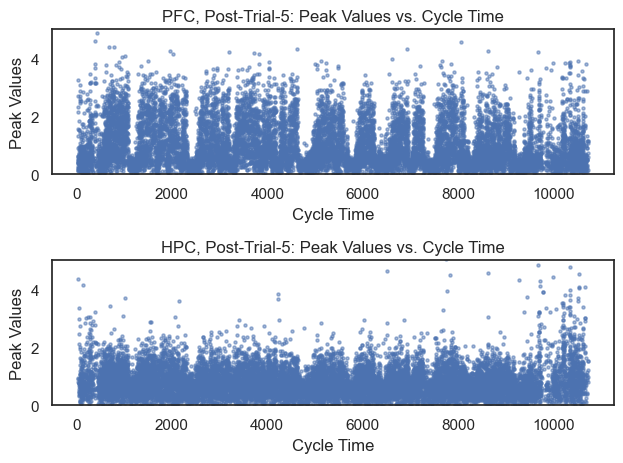

In [11]:
plt.subplot(2,1,1)
plt.scatter(metrics_pfc_pt5['cycle_time'], metrics_pfc_pt5['peak_values'], alpha=0.5, s=5)
plt.xlabel('Cycle Time')
plt.ylabel('Peak Values')
plt.title('PFC, Post-Trial-5: Peak Values vs. Cycle Time')
plt.ylim(0,5)

plt.subplot(2,1,2)
plt.scatter(metrics_hpc_pt5['cycle_time'], metrics_hpc_pt5['peak_values'], alpha=0.5, s=5)
plt.xlabel('Cycle Time')
plt.ylabel('Peak Values')
plt.ylim(0,5)
plt.title('HPC, Post-Trial-5: Peak Values vs. Cycle Time')
plt.tight_layout()
# plt.savefig(f'Rat {rat} Peak Values vs Cycle Time.png')

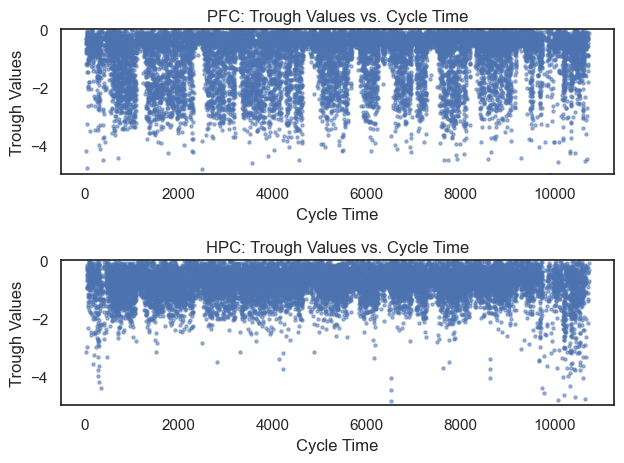

In [13]:
plt.subplot(2,1,1)
plt.scatter(metrics_pfc_pt5['cycle_time'], metrics_pfc_pt5['trough_values'], alpha=0.5, s=5)
plt.xlabel('Cycle Time')
plt.ylabel('Trough Values')
plt.title('PFC: Trough Values vs. Cycle Time')
plt.ylim(-5,0)

plt.subplot(2,1,2)
plt.scatter(metrics_hpc_pt5['cycle_time'], metrics_hpc_pt5['trough_values'], alpha=0.5, s=5)
plt.xlabel('Cycle Time')
plt.ylabel('Trough Values')
plt.ylim(-5,0)
plt.title('HPC: Trough Values vs. Cycle Time')
plt.tight_layout()
# plt.savefig(f'Rat {rat} Trough Values vs Cycle Time.png')

### Plots for Asc2desc and peak values

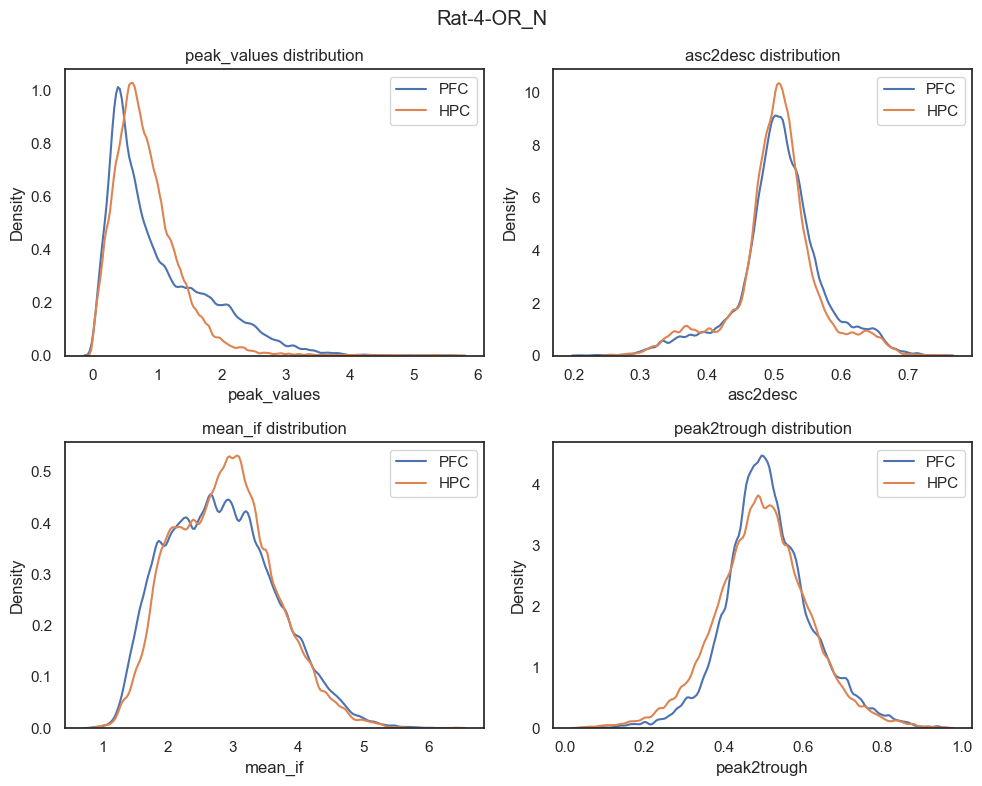

In [15]:
plt.figure(figsize=(10,8), facecolor='white')
plt.subplot(2,2,1)
sns.kdeplot(data=metrics_pfc_pt5, x="peak_values", bw_adjust=.4, label="PFC")
sns.kdeplot(data=metrics_hpc_pt5, x="peak_values", bw_adjust=.4, label="HPC")
plt.title(f'peak_values distribution')
plt.legend();

plt.subplot(2,2,2)
sns.kdeplot(data=metrics_pfc_pt5, x="asc2desc", bw_adjust=.4, label="PFC")
sns.kdeplot(data=metrics_hpc_pt5, x="asc2desc", bw_adjust=.4, label="HPC")
plt.title(f'asc2desc distribution')
plt.legend();

plt.subplot(2,2,3)
sns.kdeplot(data=metrics_pfc_pt5, x="mean_if", bw_adjust=.4, label="PFC")
sns.kdeplot(data=metrics_hpc_pt5, x="mean_if", bw_adjust=.4, label="HPC")
plt.title(f'mean_if distribution')
plt.legend();

plt.subplot(2,2,4)
sns.kdeplot(data=metrics_pfc_pt5, x="peak2trough", bw_adjust=.4, label="PFC")
sns.kdeplot(data=metrics_hpc_pt5, x="peak2trough", bw_adjust=.4, label="HPC")
plt.title(f'peak2trough distribution')
plt.legend();
plt.suptitle(f'Rat-{rat}-{condition}')
plt.tight_layout()
# plt.savefig(f'./plots/Rat-{rat}-{condition} Cycle Feature Distributions.png')

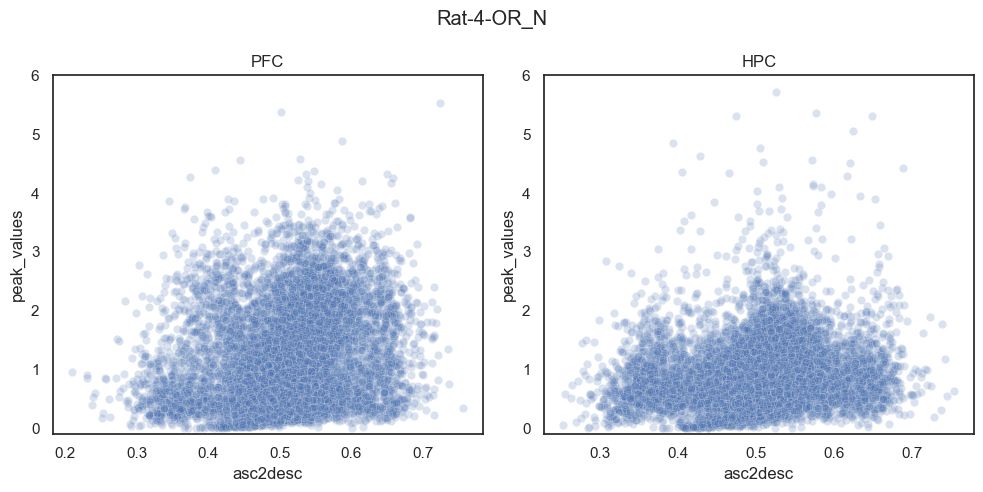

In [16]:
plt.figure(figsize=(10,5), facecolor='white')
plt.subplot(1,2,1)
sns.scatterplot(data=metrics_pfc_pt5, x='asc2desc', y='peak_values', alpha=0.2)
plt.title(f'PFC')
plt.ylim(-0.1, 6)

plt.subplot(1,2,2)
sns.scatterplot(data=metrics_hpc_pt5, x='asc2desc', y='peak_values', alpha=0.2)
plt.title(f'HPC')
plt.ylim(-0.1, 6)
plt.suptitle(f'Rat-{rat}-{condition}')
plt.tight_layout()
# plt.savefig(f'./plots/Rat-{rat}-{condition} peak_values vs asc2desc.png')

In [21]:
corrs_hpc = []
for i in [1, 4, 9, 13]:
    Rat_data = pd.read_hdf('./cycles_data/HPC_resampled_cycles_data.h5', f'Rat_{i}_{condition}')
    Rat_data = Rat_data[Rat_data['max_amp'] >= np.percentile(Rat_data['max_amp'], 25)]
    metrics = Rat_data.iloc[:, :-128]
    corr = np.corrcoef(metrics['peak_values'], metrics['asc2desc'])
    corrs_hpc.append(corr[0][1])

corrs_pfc = []
for i in [1, 4, 9, 13]:
    Rat_data = pd.read_hdf('./cycles_data/PFC_resampled_cycles_data.h5', f'Rat_{i}_{condition}')
    Rat_data = Rat_data[Rat_data['max_amp'] >= np.percentile(Rat_data['max_amp'], 25)]
    metrics = Rat_data.iloc[:, :-128]
    corr = np.corrcoef(metrics['peak_values'], metrics['asc2desc'])
    corrs_pfc.append(corr[0][1])
corrs = pd.DataFrame({'HPC': corrs_hpc, 'PFC': corrs_pfc, 'rat': [1, 4, 9, 13]})
corrs = corrs.melt(id_vars='rat', var_name='region', value_name='corr')
corrs

,rat,region,corr
0,1,HPC,0.175603
1,4,HPC,0.116027
2,9,HPC,0.247573
3,13,HPC,0.198548
4,1,PFC,0.330464
5,4,PFC,0.166835
6,9,PFC,0.342422
7,13,PFC,0.290952


(-0.01, 0.35)

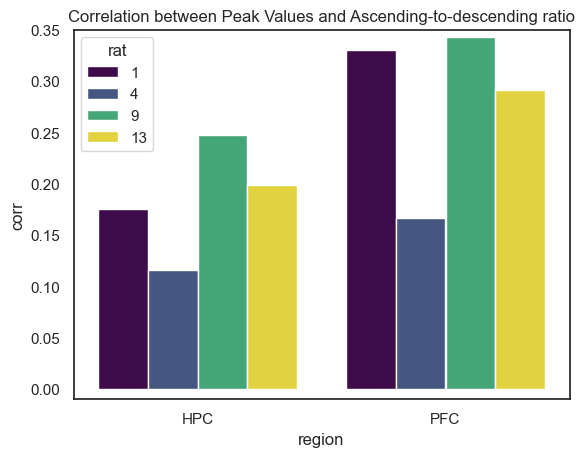

In [23]:
sns.barplot(data=corrs, x='region', y='corr', hue='rat', palette='viridis')
plt.title('Correlation between Peak Values and Ascending-to-descending ratio')
plt.ylim(-0.01, 0.35)
# plt.savefig("Correlation between Peak Values and Ascending-to-descending ratio.png") 

### UMAP

In [636]:
# Get UMAP embeddings with default settings
umap_embedder_pfc = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=3, metric='euclidean', random_state=42)
embedding_pfc = umap_embedder_pfc.fit(waveforms_pfc)
emb_pfc = embedding_pfc.embedding_

C:\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\anaconda3\Lib\site-packages\umap\umap_.py:1945: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



In [637]:
# Get UMAP embeddings with default settings
umap_embedder_hpc = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=3, metric='euclidean', random_state=42)
embedding_hpc = umap_embedder_hpc.fit(waveforms_hpc)
emb_hpc = embedding_hpc.embedding_

C:\anaconda3\Lib\site-packages\sklearn\utils\deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

C:\anaconda3\Lib\site-packages\umap\umap_.py:1945: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



In [638]:
def get_section(start_sample, section_size=45, fs=2500):
    section_samples = section_size * fs * 60
    section_number = int(start_sample // section_samples) + 1
    return section_number

In [639]:
metrics_pfc['section'] = metrics_pfc['start_sample'].apply(get_section)
metrics_hpc['section'] = metrics_hpc['start_sample'].apply(get_section)

In [640]:
def get_inflection_points(signal):
    cycle = signal[10:118]
    second_derivative = np.diff(np.diff(cycle))
    num_inflections = len(np.where(np.diff(np.sign(second_derivative)) != 0)[0])
    return num_inflections

In [641]:
metrics_pfc['num_inflections'] = list(map(get_inflection_points, waveforms_pfc))

In [642]:
metrics_hpc['num_inflections'] = list(map(get_inflection_points, waveforms_hpc))

In [252]:
# If alignment needed
emb = embedding_pfc.embedding_
centroid = np.mean(emb_pfc, axis=0)
emb_flipped = emb_pfc.copy()
emb_flipped[:, 2] = 2 * centroid[2] - emb_pfc[:, 2]
emb_pfc = emb_flipped

In [ ]:
# 3D plots of features projected on UMAP
features = ['duration_samples', 'peak2trough', 'asc2desc', 'max_amp','trough_values', 'peak_values', 'mean_if', 'max_if', 'range_if']
data = metrics_pfc_pt5

for feature in features:
    fig = px.scatter_3d(x=emb_pfc[:,0], y=emb_pfc[:,1], z=emb_pfc[:,2],
                  color=data[feature])
    fig.update_layout(autosize=False,
                      width=800,
                      height=600,
                      scene=Scene(xaxis=XAxis(title='UMAP-1'),
                                yaxis=YAxis(title='UMAP-2'),
                                zaxis=ZAxis(title='UMAP-3')),
                      coloraxis_colorbar_title=feature,
                      # coloraxis=dict(
                      #       cmin=np.percentile(data[feature], 5),  # Minimum value for the color scale (you can also use the 5th percentile if preferred)
                      #       cmax=np.percentile(data[feature], 95)  # Maximum value for the color scale (95th percentile)
                      # )
    )
    # fig.write_html(f"./plots/ORN_PFC_vs_HPC/Rat{rat}/Rat_{rat}_ORN_PFC_embedding_{feature}.html")

In [ ]:
# 3D plots of features projected on UMAP
features = ['duration_samples', 'peak2trough', 'asc2desc', 'max_amp','trough_values', 'peak_values', 'mean_if', 'max_if', 'range_if']
data = metrics_hpc_pt5

for feature in features:
    fig = px.scatter_3d(x=emb_hpc[:,0], y=emb_hpc[:,1], z=emb_hpc[:,2],
                  color=data[feature])
    fig.update_layout(autosize=False,
                      width=800,
                      height=600,
                      scene=Scene(xaxis=XAxis(title='UMAP-1'),
                                yaxis=YAxis(title='UMAP-2'),
                                zaxis=ZAxis(title='UMAP-3')),
                      coloraxis_colorbar_title=feature,
                      # coloraxis=dict(
                      #       cmin=np.percentile(data[feature], 5),  # Minimum value for the color scale (you can also use the 5th percentile if preferred)
                      #       cmax=np.percentile(data[feature], 95)  # Maximum value for the color scale (95th percentile)
                      # )
    )
    # fig.write_html(f"./plots/ORN_PFC_vs_HPC/Rat{rat}/Rat_{rat}_ORN_HPC_embedding_{feature}.html")

In [603]:
metrics_pfc.columns[:25]

Index(['index', 'is_good', 'start_sample', 'stop_sample', 'duration',
       'duration_samples', 'peak2trough', 'asc2desc', 'max_amp',
       'trough_values', 'peak_values', 'mean_if', 'max_if', 'range_if',
       'trough_position', 'peak_position', 'chain_ind', 'State', 'Post_Trial',
       'cycle_time', 'section', 'num_inflections'],
      dtype='object')

In [643]:
# 3D plot of sleep states projected on UMAP
data = metrics_pfc
# ['duration_samples', 'peak2trough', 'asc2desc', 'max_amp','trough_values', 'peak_values', 'mean_if', 'max_if', 'range_if',
# 'num_inflections','cycle_time']
data['num_inflections'] = pd.Categorical(data.num_inflections)
data['section'] = pd.Categorical(data.section)
data['Post_Trial'] = pd.Categorical(data.Post_Trial)
feature = 'num_inflections'
fig = px.scatter_3d(x=emb_pfc[:,0], y=emb_pfc[:,1], z=emb_pfc[:,2],
              color=data[feature], color_discrete_map=state_color_map)
fig.update_layout(autosize=False,width=800,height=600,
                 scene=Scene(xaxis=XAxis(title='UMAP-1'),yaxis=YAxis(title='UMAP-2'),zaxis=ZAxis(title='UMAP-3')),
                  title=dict(text=f"PFC: Projection of {feature} on UMAP",font=dict(size=20),x=0.5,),
                  coloraxis=dict(
                            cmin=np.percentile(data[feature], 1),
                            cmax=np.percentile(data[feature], 99)
                      ),
                 legend_title_text=feature
)
fig.update_traces(marker=dict(size=5))
fig.show()
# fig.write_html(f"./plots/UMAP-ORN-Whole/Rat{rat}/Rat_{rat}_ORN_PFC_embedding_state.html")
# fig.write_image("Rat6_ORN_PFC_3D_embedding.png", engine="kaleido")

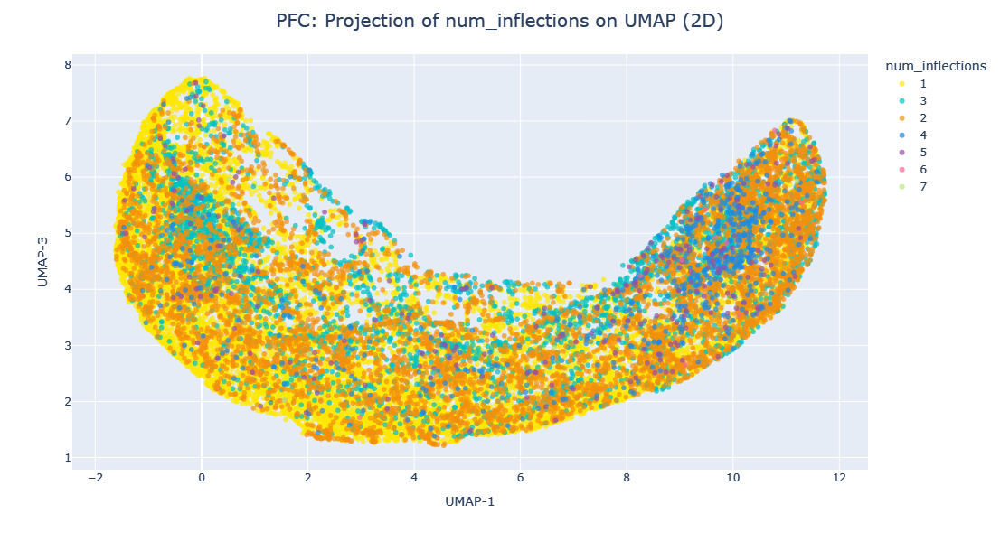

In [644]:
# ['duration_samples', 'peak2trough', 'asc2desc', 'max_amp','trough_values', 'peak_values', 'mean_if', 'max_if', 'range_if',
# 'num_inflections','cycle_time']
feature = 'num_inflections'
fig = px.scatter(
    x=emb_pfc[:, 0],  # UMAP-1
    y=emb_pfc[:, 2],  # UMAP-3
    color=data[feature],
    color_discrete_map=state_color_map,
    opacity=0.7
)

fig.update_layout(
    autosize=False,
    width=800,
    height=600,
    xaxis_title="UMAP-1",
    yaxis_title="UMAP-3",
    title=dict(
        text=f"PFC: Projection of {feature} on UMAP (2D)",
        font=dict(size=20),
        x=0.5,
    ),
    legend_title_text=feature,
    coloraxis=dict(
        cmin=np.percentile(data[feature], 1),
        cmax=np.percentile(data[feature], 99),
    ),
)
fig.show()

In [646]:
# 3D plot of sleep states projected on UMAP
data = metrics_hpc
# ['duration_samples', 'peak2trough', 'asc2desc', 'max_amp','trough_values', 'peak_values', 'mean_if', 'max_if', 'range_if',
# 'num_inflections','cycle_time']
data['num_inflections'] = pd.Categorical(data.num_inflections)
data['section'] = pd.Categorical(data.section)
data['Post_Trial'] = pd.Categorical(data.Post_Trial)
feature = 'num_inflections'
fig = px.scatter_3d(x=emb_hpc[:,0], y=emb_hpc[:,1], z=emb_hpc[:,2],
              color=data[feature], color_discrete_map=state_color_map)
fig.update_layout(autosize=False,
                 width=800,
                 height=600,
                 scene=Scene(xaxis=XAxis(title='UMAP-1'),
                            yaxis=YAxis(title='UMAP-2'),
                            zaxis=ZAxis(title='UMAP-3')),
                  title=dict(
                        text=f"HPC: Projection of {feature} on UMAP",
                        font=dict(size=20),
                        x=0.5,  # Center the title
                    ),coloraxis=dict(
                            cmin=np.percentile(data[feature], 1),  # Minimum value for the color scale (you can also use the 5th percentile if preferred)
                            cmax=np.percentile(data[feature], 99)  # Maximum value for the color scale (95th percentile)
                      ),
                 legend_title_text=feature,
)
fig.update_traces(marker=dict(size=5))
fig.show()
# fig.write_html(f"./plots/UMAP-ORN-Whole/Rat{rat}/Rat_{rat}_ORN_PFC_embedding_state.html")
# fig.write_image("Rat6_ORN_PFC_3D_embedding.png", engine="kaleido")

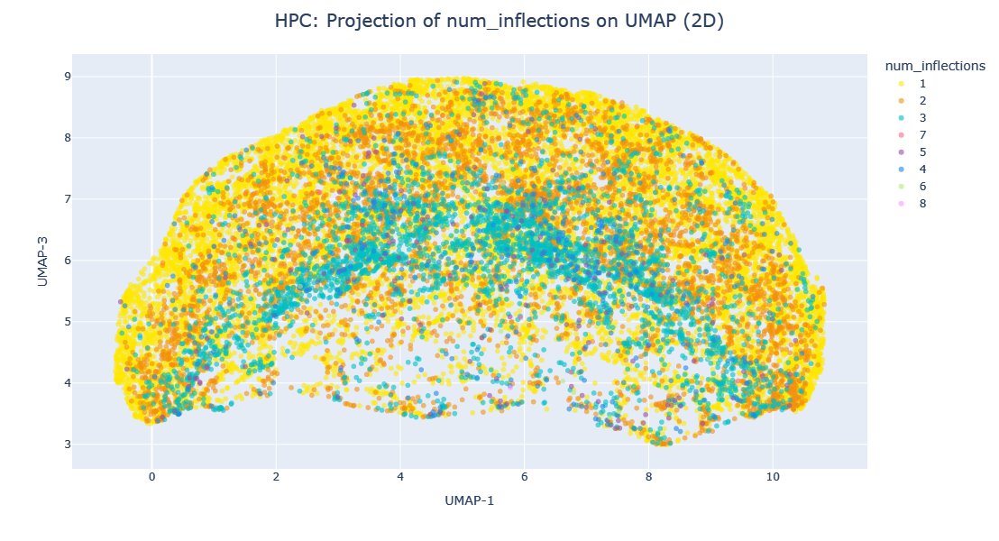

In [647]:
# ['duration_samples', 'peak2trough', 'asc2desc', 'max_amp','trough_values', 'peak_values', 'mean_if', 'max_if', 'range_if',
# 'num_inflections','cycle_time']
feature = 'num_inflections'
fig = px.scatter(
    x=emb_hpc[:, 0],  # UMAP-1
    y=emb_hpc[:, 2],  # UMAP-3
    color=data[feature],
    color_discrete_map=state_color_map,
    opacity=0.6
)

fig.update_layout(
    autosize=False,
    width=800,
    height=600,
    xaxis_title="UMAP-1",
    yaxis_title="UMAP-3",
    title=dict(
        text=f"HPC: Projection of {feature} on UMAP (2D)",
        font=dict(size=20),
        x=0.5,
    ),
    legend_title_text=feature,
    coloraxis=dict(
        cmin=np.percentile(data[feature], 1),
        cmax=np.percentile(data[feature], 99),
    ),
)

fig.show()

### Examples of UMAP-3 cycles

In [657]:
cycles = np.where((emb_pfc[:, 2] <= np.mean(emb_pfc[:, 2])+0.5) & 
         (emb_pfc[:, 2] >= np.mean(emb_pfc[:, 2])-0.5) &
         (emb_pfc[:, 1] <= np.percentile(emb_pfc[:, 1], 20)))[0]

In [618]:
cycles = np.where((emb_hpc[:, 2] <= np.mean(emb_hpc[:, 2])+0.5) & 
         (emb_hpc[:, 2] >= np.mean(emb_hpc[:, 2])-0.5) &
         (emb_hpc[:, 1] >= np.percentile(emb_hpc[:, 1], 80)))[0]

In [658]:
cycles

array([    6,    12,    19, ..., 25264, 25336, 25397], dtype=int64)

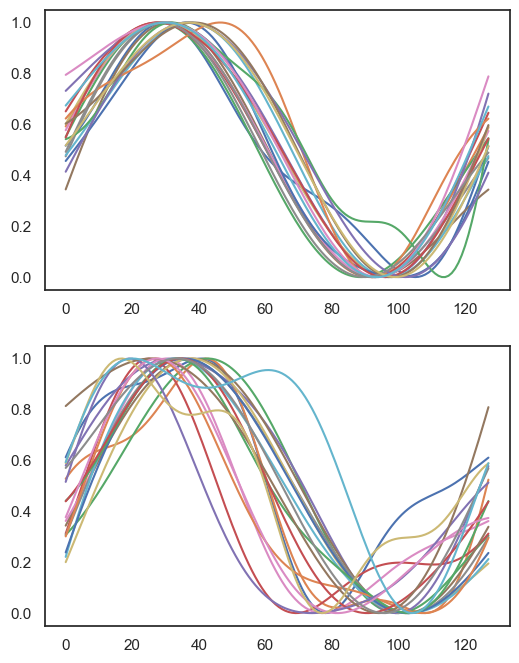

In [312]:
plt.figure(figsize=(6,8), facecolor='white')
plt.subplot(2,1,1)
cycles = np.where(emb_pfc[:, 2] <= np.percentile(emb_pfc[:, 2], 20))[0]
for i in range(20):
    index = np.random.choice(cycles)
    cycle = waveforms_pfc[index]
    cycle = (cycle-min(cycle))/(max(cycle)-min(cycle))
    # cycle = np.diff(cycle)
    plt.plot(cycle);

plt.subplot(2,1,2)
cycles = np.where(emb_pfc[:, 2] >= np.percentile(emb_pfc[:, 2], 80))[0]
for i in range(20):
    index = np.random.choice(cycles)
    cycle = waveforms_pfc[index]
    cycle = (cycle-min(cycle))/(max(cycle)-min(cycle))
    # cycle = np.diff(cycle)
    plt.plot(cycle);

In [ ]:
data = metrics_pfc_pt5.iloc[cycles]
sns.kdeplot(data=data, x="peak_values", bw_adjust=.4, label="PFC")
# sns.kdeplot(data=data, x="peak_values", bw_adjust=.4, label="HPC")
# plt.title(f'Rat-{rat}-OR_N peak_values distribution')
plt.legend();

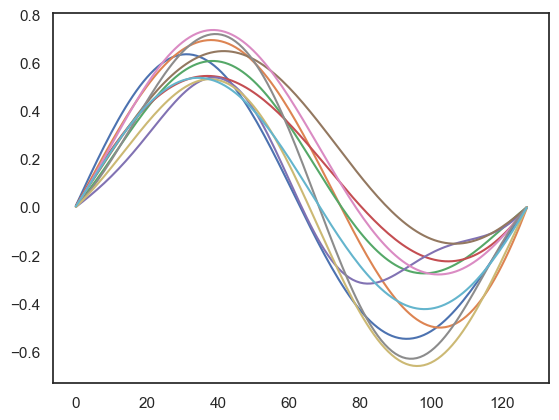

In [344]:
cycles = np.where(emb_pfc[:, 1] >= np.percentile(emb_pfc[:, 1], 90))[0]
for i in range(10):
    index = np.random.choice(cycles)
    cycle = waveforms_pfc_pt5[index]
    # cycle = (cycle-min(cycle))/(max(cycle)-min(cycle))
    plt.plot(cycle);

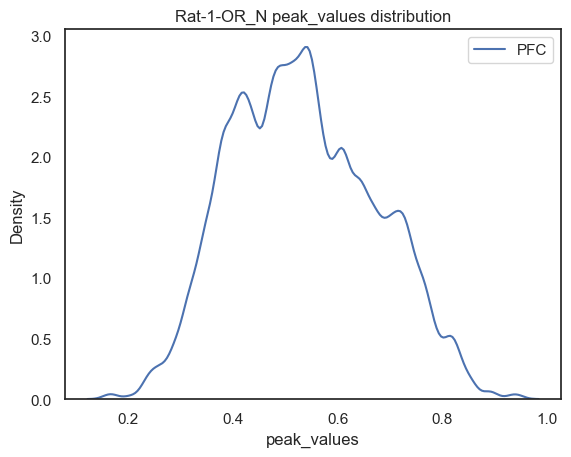

In [341]:
data = metrics_pfc_pt5.iloc[cycles]
sns.kdeplot(data=data, x="peak_values", bw_adjust=.4, label="PFC")
# sns.kdeplot(data=data, x="peak_values", bw_adjust=.4, label="HPC")
# plt.title(f'Rat-{rat}-OR_N peak_values distribution')
plt.legend();

### Inverse Transformed cycles for UMAP-3

In [653]:
n = 10
points = np.zeros((n,3))
points[:, 0] = np.mean(emb_pfc[:, 0], axis=0)
points[:, 2] = np.linspace(3, 7, n)
points[:, 1] = np.mean(emb_pfc[:, 1], axis=0)
umap_points = embedding_pfc.inverse_transform(points)

In [ ]:
fig = go.Figure()
cmap = plt.get_cmap('viridis')
for i, row in enumerate(umap_points):
    color = f'rgba{cmap(points[i])}'
    fig.add_trace(go.Scatter(x=np.arange(umap_points.shape[1]), y=row, mode='lines'))
fig.show()

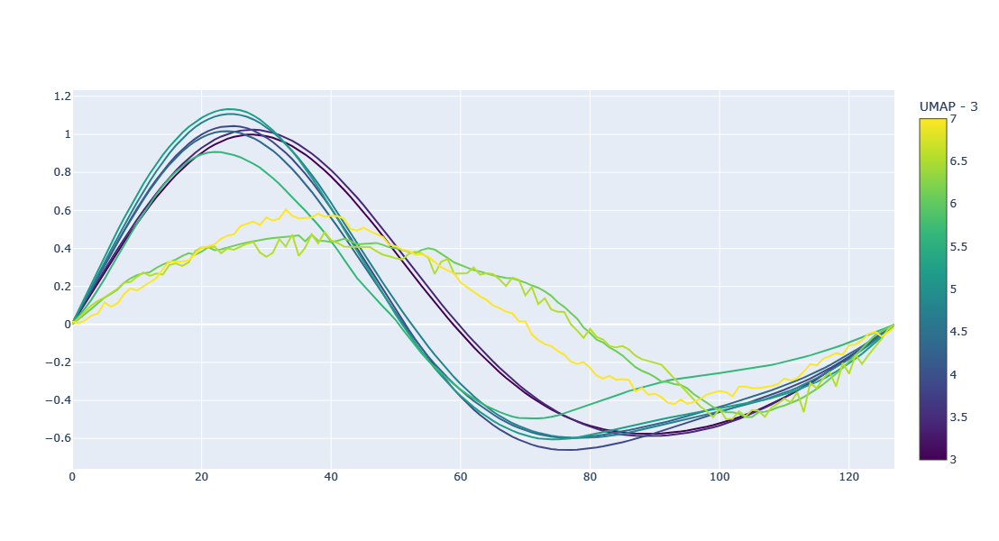

In [654]:
import plotly.graph_objects as go

fig = go.Figure()
x = np.arange(umap_points.shape[1])
cmap = plt.get_cmap('viridis')
normalized_points = [(val - min(points[:, 2])) / (max(points[:, 2]) - min(points[:, 2])) for val in points[:, 2]]

# Add a line for each row in the 2D array
for i, row in enumerate(umap_points):
    color = f'rgba{cmap(normalized_points[i])}'
    fig.add_trace(go.Scatter(x=x, y=row, mode='lines', line=dict(color=color, width=2)))

# Add titles and labels
fig.update_layout(
    autosize=False,
    width=600,
    height=600,
    showlegend=False
)
colorbar_trace = go.Scatter(
    x=[None], y=[None],
    mode='markers',
    marker=dict(
        colorscale='Viridis',  # Same colormap used for the lines
        showscale=True,        # Show the color bar
        cmin=min(points[:, 2]),                # Min value for the color bar
        cmax=max(points[:, 2]),      # Max value for the color bar
        colorbar=dict(
            title="UMAP - 3" # Title for the color bar
        )
    ),
    hoverinfo='none'
)

# Add the colorbar trace to the figure
fig.add_trace(colorbar_trace)

# Show the plot
fig.show()
# fig.write_image("./plots_25_09_2024/combined_OR_N_UMAP1_waveforms.svg")

### SI

In [255]:
params = {
    'n_bins': 10,
    'n_neighbors': 15,
    'discrete_label': False,
    'num_shuffles': 10,
    'verbose': False,
}

In [257]:
SI_pfc_p2t, binLabel_pfc_p2t, overlapMat_pfc_p2t, sSI_pfc_p2t = compute_structure_index(emb_pfc, np.array(metrics_pfc_pt5['peak2trough']), **params)
SI_pfc_peak, binLabel_pfc_peak, overlapMat_pfc_peak, sSI_pfc_peak = compute_structure_index(emb_pfc, np.array(metrics_pfc_pt5['peak_values']), **params)
SI_hpc_p2t, binLabel_hpc_p2t, overlapMat_hpc_p2t, sSI_hpc_p2t = compute_structure_index(emb_hpc, np.array(metrics_hpc_pt5['peak2trough']), **params)
SI_hpc_peak, binLabel_hpc_peak, overlapMat_hpc_peak, sSI_hpc_peak = compute_structure_index(emb_hpc, np.array(metrics_hpc_pt5['peak_values']), **params)

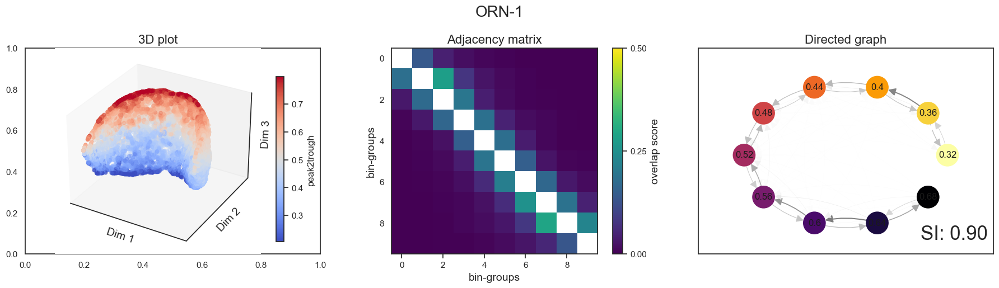

In [266]:
plot_SI(emb_pfc, metrics_pfc_pt5, 'peak2trough', SI_pfc_p2t, binLabel_pfc_p2t, overlapMat_pfc_p2t)

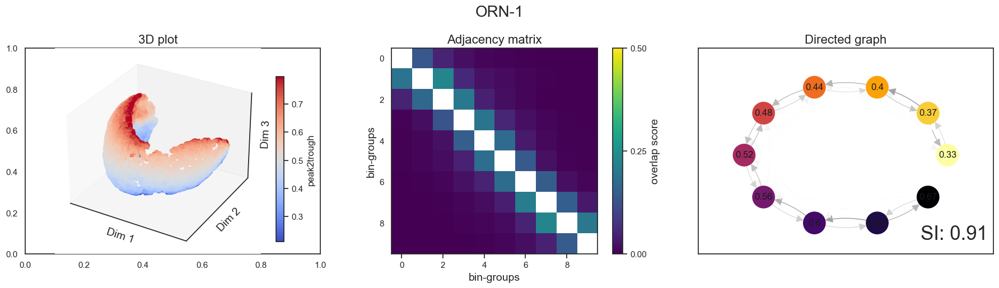

In [267]:
plot_SI(emb_hpc, metrics_hpc_pt5, 'peak2trough', SI_hpc_p2t, binLabel_hpc_p2t, overlapMat_hpc_p2t)

In [116]:
centroids_hpc_peak = []
centroids_hpc_p2t = []
centroids_pfc_peak = []
centroids_pfc_p2t = []
for i in range(10):
    centroids_pfc_p2t.append(np.mean(emb_pfc[binLabel_pfc_p2t[0] == i], axis=0))
    centroids_pfc_peak.append(np.mean(emb_pfc[binLabel_pfc_peak[0] == i], axis=0))
    centroids_hpc_p2t.append(np.mean(emb_hpc[binLabel_hpc_p2t[0] == i], axis=0))
    centroids_hpc_peak.append(np.mean(emb_hpc[binLabel_hpc_peak[0] == i], axis=0))
centroids_pfc_p2t = np.array(centroids_pfc_p2t)
centroids_pfc_peak = np.array(centroids_pfc_peak)
centroids_hpc_p2t = np.array(centroids_hpc_p2t)
centroids_hpc_peak = np.array(centroids_hpc_peak)

In [ ]:
# 3D plot of sleep states projected on UMAP
feature = 'peak2trough'
scatter1 = go.Scatter3d(x=emb_pfc[:, 0], y=emb_pfc[:, 1], z=emb_pfc[:, 2],
    mode='markers', marker=dict(
        size=5, color=metrics_pfc[feature],
        cmin=np.percentile(metrics_pfc[feature], 1),
        cmax=np.percentile(metrics_pfc[feature], 99),
        colorbar=dict(title=feature),),)
scatter2 = go.Scatter3d(x=centroids_pfc_peak[:, 0], y=centroids_pfc_peak[:, 1], z=centroids_pfc_peak[:, 2],
    mode='markers', marker=dict(
        size=8,
        color='red',
        symbol='cross'),)
scatter3 = go.Scatter3d(x=centroids_pfc_p2t[:, 0], y=centroids_pfc_p2t[:, 1], z=centroids_pfc_p2t[:, 2],
    mode='markers', marker=dict(
        size=8,
        color='green',
        symbol='cross'),)
fig = go.Figure(data=[scatter1, scatter2, scatter3])
fig.update_layout(autosize=False,
                 width=800,
                 height=600,
                 scene=Scene(xaxis=XAxis(title='UMAP-1'),
                            yaxis=YAxis(title='UMAP-2'),
                            zaxis=ZAxis(title='UMAP-3')),
                  coloraxis_colorbar_title=feature,
                  coloraxis=dict(
                        cmin=np.percentile(data[feature], 1),
                        cmax=np.percentile(data[feature], 99)),
                 legend_title_text=feature,
)

fig.show()
# fig.write_html(f"./plots/UMAP-ORN-Whole/Rat{rat}/Rat_{rat}_ORN_PFC_embedding_state.html")
# fig.write_image("Rat6_ORN_PFC_3D_embedding.png", engine="kaleido")

In [ ]:
# 3D plot of sleep states projected on UMAP
feature = 'peak2trough'
scatter1 = go.Scatter3d(x=emb_hpc[:, 0], y=emb_hpc[:, 1], z=emb_hpc[:, 2],
    mode='markers', marker=dict(
        size=5, color=metrics_hpc[feature],
        cmin=np.percentile(metrics_hpc[feature], 1),
        cmax=np.percentile(metrics_hpc[feature], 99),
        colorbar=dict(title=feature),),)
scatter2 = go.Scatter3d(x=centroids_hpc_peak[:, 0], y=centroids_hpc_peak[:, 1], z=centroids_hpc_peak[:, 2],
    mode='markers', marker=dict(
        size=8,
        color='red',
        symbol='cross'),)
scatter3 = go.Scatter3d(x=centroids_hpc_p2t[:, 0], y=centroids_hpc_p2t[:, 1], z=centroids_hpc_p2t[:, 2],
    mode='markers', marker=dict(
        size=8,
        color='green',
        symbol='cross'),)
fig = go.Figure(data=[scatter1, scatter2, scatter3])
fig.update_layout(autosize=False,
                 width=800,
                 height=600,
                 scene=Scene(xaxis=XAxis(title='UMAP-1'),
                            yaxis=YAxis(title='UMAP-2'),
                            zaxis=ZAxis(title='UMAP-3')),
                  coloraxis_colorbar_title=feature,
                  coloraxis=dict(
                        cmin=np.percentile(data[feature], 1),
                        cmax=np.percentile(data[feature], 99)),
                 legend_title_text=feature,
)

fig.show()
# fig.write_html(f"./plots/UMAP-ORN-Whole/Rat{rat}/Rat_{rat}_ORN_PFC_embedding_state.html")
# fig.write_image("Rat6_ORN_PFC_3D_embedding.png", engine="kaleido")

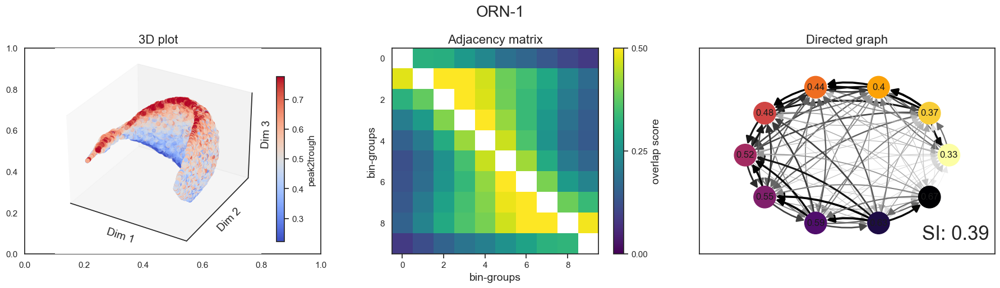

In [127]:
plot_SI(emb_hpc, metrics_hpc, 'peak2trough', SI_hpc_p2t, binLabel_hpc_p2t, overlapMat_hpc_p2t)

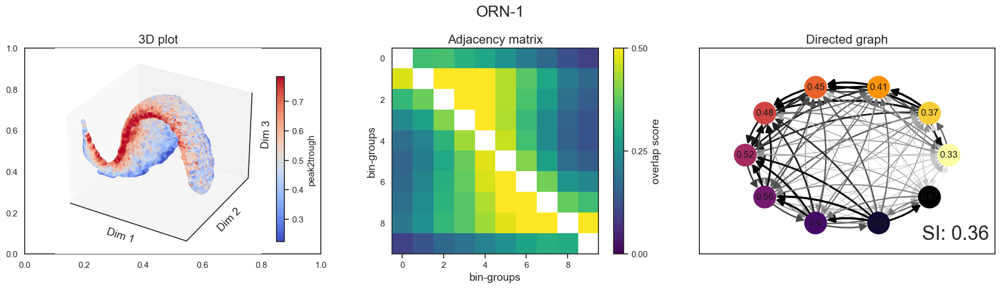

In [128]:
plot_SI(emb_pfc, metrics_pfc, 'peak2trough', SI_pfc_p2t, binLabel_pfc_p2t, overlapMat_pfc_p2t)

In [264]:
def plot_SI(emb, metrics, feature, SI, binLabel, overlapMat):
    fig, ax = plt.subplots(1, 3, figsize=(18,5))
    
    # plot 3D scatter
    at = plt.subplot(1,3,1,projection = '3d')
    b = at.scatter(*emb[:, :3].T, c = np.array(metrics[feature]), cmap = 'coolwarm',
                   vmin= np.percentile(metrics[feature],1),
                   vmax = np.percentile(metrics[feature],99))
    cbar = fig.colorbar(b,ax=at,anchor=(0, 0.3), shrink=0.8)
    cbar.set_label(feature, rotation=90)
    at.set_title(f'3D plot', size=16);
    at.set_xlabel('Dim 1', labelpad=-8, size=14)
    at.set_ylabel('Dim 2', labelpad=-8, size=14)
    at.set_zlabel('Dim 3', labelpad=-8, size=14)
    at.set_xticks([])
    at.set_yticks([])
    at.set_zticks([])
    
    # plot adjacency matrix
    b = ax[1].matshow(overlapMat, vmin = 0, vmax = 0.5, cmap = plt.cm.viridis)
    ax[1].xaxis.set_ticks_position('bottom')
    cbar = fig.colorbar(b,ax=ax[1],anchor=(0, 0.2), shrink=1, ticks=[0,0.25,0.5])
    cbar.set_label('overlap score', rotation=90, fontsize = 14)
    ax[1].set_title('Adjacency matrix', size=16);
    ax[1].set_xlabel('bin-groups', size=14)
    ax[1].set_ylabel('bin-groups', size=14)
    
    # plot weighted directed graph
    draw_graph(overlapMat, ax[2],node_cmap=plt.cm.inferno_r,edge_cmap=plt.cm.Greys,
                                      node_names = np.round(binLabel[1][:,0,1],2));
    ax[2].set_xlim(1.2*np.array(ax[2].get_xlim()));
    ax[2].set_ylim(1.2*np.array(ax[2].get_ylim()));
    ax[2].set_title('Directed graph', size=16);
    ax[2].text(0.98, 0.05, f"SI: {SI:.2f}", horizontalalignment='right',
         verticalalignment='bottom', transform=ax[2].transAxes,fontsize=25)
    fig.suptitle(f'ORN-{rat}', fontsize=20)
    plt.tight_layout()
    
    # plt.savefig('orn_1_si.png')

# Split HPC and PFC across time

In [883]:
metrics_pfc_pt5['section'] = metrics_pfc_pt5['start_sample'].apply(get_section, section_size=30)
metrics_hpc_pt5['section'] = metrics_hpc_pt5['start_sample'].apply(get_section, section_size=30)

In [893]:
# Split 3D plot with projected sleep states
data = metrics_hpc_pt5

# Assign section based on start_sample and create z_offset using height_offsets
# metrics_pfc_pt5['section'] = metrics_pfc_pt5['start_sample'].apply(get_section)
height_offsets = {1: 0, 2: 12, 3: 24, 4: 36, 5: 48, 6: 60}
data['z_offset'] = emb_hpc[:, 2] + np.array(data['section'].map(height_offsets))

fig = px.scatter_3d(
    x=emb_hpc[:, 0], 
    y=emb_hpc[:, 1], 
    z=data['z_offset'],
    color=data['State'],
    color_discrete_map=state_color_map
)

for section, z_pos in height_offsets.items():
    fig.add_trace(
        go.Scatter3d(
            x=[-5], y=[10], z=[z_pos + 5],
            mode='text',
            text=f"{(section-1)*45} - {section*45} minutes",
            textfont=dict(size=12, color='black'),
            showlegend=False
        )
    )

fig.update_layout(
    autosize=False,
    width=800,
    height=800,
    scene=dict(
        xaxis=dict(title='UMAP-1'),
        yaxis=dict(title='UMAP-2'),
        zaxis=dict(title='UMAP-3')
    ),
    legend_title_text="State"
)
fig.show()
# fig.write_html(f"./plots/UMAP-ORN-Whole/Rat{rat}/Rat_{rat}_ORN_HPC_split_embedding_state.html")

# Combine Rats

In [171]:
Rat1_data_pfc = pd.read_hdf('./cycles_data/PFC_resampled_cycles_data.h5', f'Rat_1_OR_N')
Rat1_data_pfc['rat'] = 1
Rat4_data_pfc = pd.read_hdf('./cycles_data/PFC_resampled_cycles_data.h5', f'Rat_4_OR_N')
Rat4_data_pfc['rat'] = 4
Rat9_data_pfc = pd.read_hdf('./cycles_data/PFC_resampled_cycles_data.h5', f'Rat_9_OR_N')
Rat9_data_pfc['rat'] = 9
Rat13_data_pfc = pd.read_hdf('./cycles_data/PFC_resampled_cycles_data.h5', f'Rat_13_OR_N')
Rat13_data_pfc['rat'] = 13
Rat_data_pfc = pd.concat([Rat1_data_pfc, Rat4_data_pfc, Rat9_data_pfc, Rat13_data_pfc])
# Rat_data_pfc = Rat_data_pfc[Rat_data_pfc['max_amp'] >= 0.5] #np.percentile(Rat_data_pfc['max_amp'], 40)]
metrics_pfc = Rat_data_pfc.iloc[:, :-128]
waveforms_pfc = np.array(Rat_data_pfc.iloc[:, -128:])

In [173]:
Rat1_data_hpc = pd.read_hdf('./cycles_data/HPC_resampled_cycles_data.h5', f'Rat_1_OR_N')
Rat1_data_hpc['rat'] = 1
Rat4_data_hpc = pd.read_hdf('./cycles_data/HPC_resampled_cycles_data.h5', f'Rat_4_OR_N')
Rat4_data_hpc['rat'] = 4
Rat9_data_hpc = pd.read_hdf('./cycles_data/HPC_resampled_cycles_data.h5', f'Rat_9_OR_N')
Rat9_data_hpc['rat'] = 9
Rat13_data_hpc = pd.read_hdf('./cycles_data/HPC_resampled_cycles_data.h5', f'Rat_13_OR_N')
Rat13_data_hpc['rat'] = 13
Rat_data_hpc = pd.concat([Rat1_data_hpc, Rat4_data_hpc, Rat9_data_pfc, Rat13_data_hpc])
# Rat_data_hpc = Rat_data_hpc[Rat_data_hpc['max_amp'] >= 0.5] #np.percentile(Rat_data_hpc['max_amp'], 40)]
metrics_hpc = Rat_data_hpc.iloc[:, :-128]
waveforms_hpc = np.array(Rat_data_hpc.iloc[:, -128:])

In [175]:
Rat_data_pfc_pt5 = Rat_data_pfc[Rat_data_pfc['Post_Trial'] == 5]
metrics_pfc_pt5 = Rat_data_pfc_pt5.iloc[:, :-128]
waveforms_pfc_pt5 = np.array(Rat_data_pfc_pt5.iloc[:, -128:])

Rat_data_hpc_pt5 = Rat_data_hpc[Rat_data_hpc['Post_Trial'] == 5]
metrics_hpc_pt5 = Rat_data_hpc_pt5.iloc[:, :-128]
waveforms_hpc_pt5 = np.array(Rat_data_hpc_pt5.iloc[:, -128:])

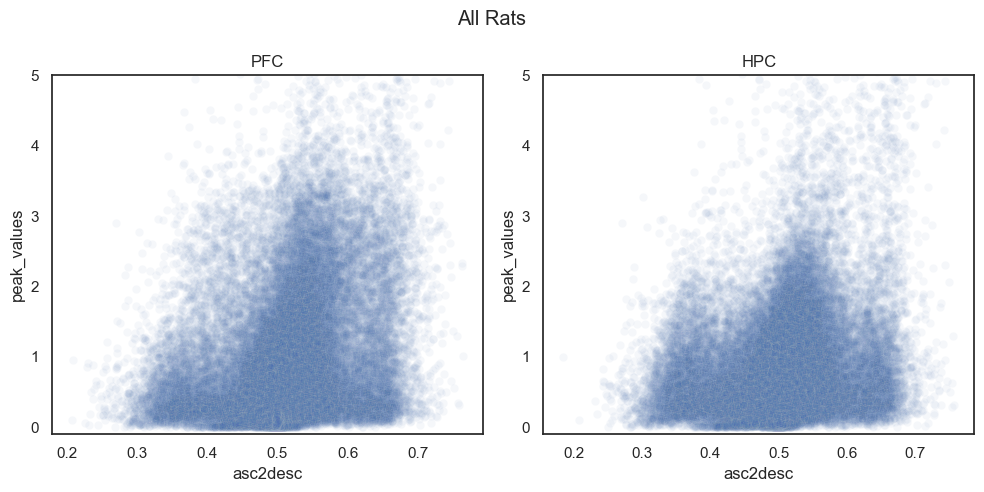

In [216]:
plt.figure(figsize=(10,5), facecolor='white')
plt.subplot(1,2,1)
sns.scatterplot(data=Rat_data_pfc_pt5, x='asc2desc', y='peak_values', alpha=0.05)
plt.title(f'PFC')
plt.ylim(-0.1, 5)

plt.subplot(1,2,2)
sns.scatterplot(data=Rat_data_hpc_pt5, x='asc2desc', y='peak_values', alpha=0.05)
plt.title(f'HPC')
plt.ylim(-0.1, 5)
plt.suptitle(f'All Rats')
plt.tight_layout()
# plt.savefig(f'./plots/Rat-{rat}-{condition} peak_values vs asc2desc.png')

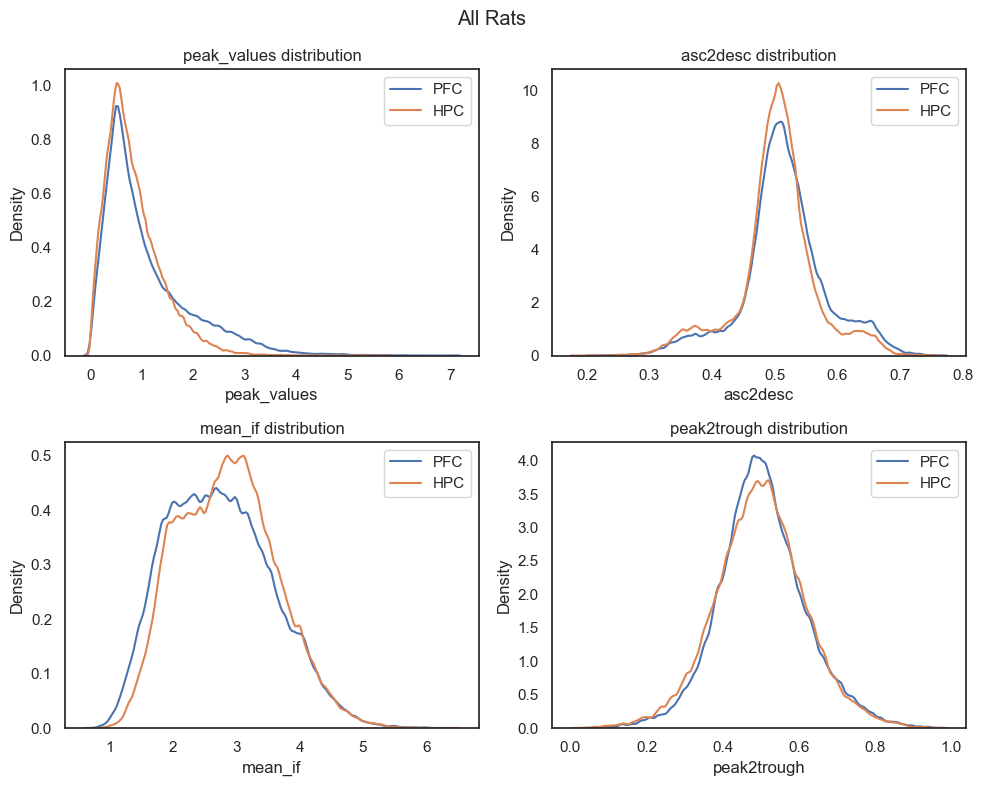

In [59]:
plt.figure(figsize=(10,8), facecolor='white')
plt.subplot(2,2,1)
sns.kdeplot(data=metrics_pfc_pt5, x="peak_values", bw_adjust=.4, label="PFC")
sns.kdeplot(data=metrics_hpc_pt5, x="peak_values", bw_adjust=.4, label="HPC")
plt.title(f'peak_values distribution')
plt.legend();

plt.subplot(2,2,2)
sns.kdeplot(data=metrics_pfc_pt5, x="asc2desc", bw_adjust=.4, label="PFC")
sns.kdeplot(data=metrics_hpc_pt5, x="asc2desc", bw_adjust=.4, label="HPC")
plt.title(f'asc2desc distribution')
plt.legend();

plt.subplot(2,2,3)
sns.kdeplot(data=metrics_pfc_pt5, x="mean_if", bw_adjust=.4, label="PFC")
sns.kdeplot(data=metrics_hpc_pt5, x="mean_if", bw_adjust=.4, label="HPC")
plt.title(f'mean_if distribution')
plt.legend();

plt.subplot(2,2,4)
sns.kdeplot(data=metrics_pfc_pt5, x="peak2trough", bw_adjust=.4, label="PFC")
sns.kdeplot(data=metrics_hpc_pt5, x="peak2trough", bw_adjust=.4, label="HPC")
plt.title(f'peak2trough distribution')
plt.legend();
plt.suptitle(f'All Rats')
plt.tight_layout()
# plt.savefig(f'./plots/10-02-2025/All Rats Feature Distributions.png')
# plt.savefig(f'./plots/Rat-{rat}-{condition} Cycle Feature Distributions.png')

In [189]:
data_pfc = Rat_data_pfc_pt5[['peak2trough', 'asc2desc', 'peak_values', 'mean_if','rat']].copy()
data_pfc.loc[:, 'region'] = 'PFC'
data_pfc = data_pfc[data_pfc['rat'] == 1]
# data_pfc = data_pfc[data_pfc['Post_Trial'] == 5]

data_hpc = Rat_data_hpc_pt5[['peak2trough', 'asc2desc', 'peak_values', 'mean_if']].copy()
data_hpc.loc[:, 'region'] = 'HPC'
# data_hpc = data_hpc[data_hpc['Post_Trial'] == 5]

data = pd.concat([data_pfc, data_hpc])

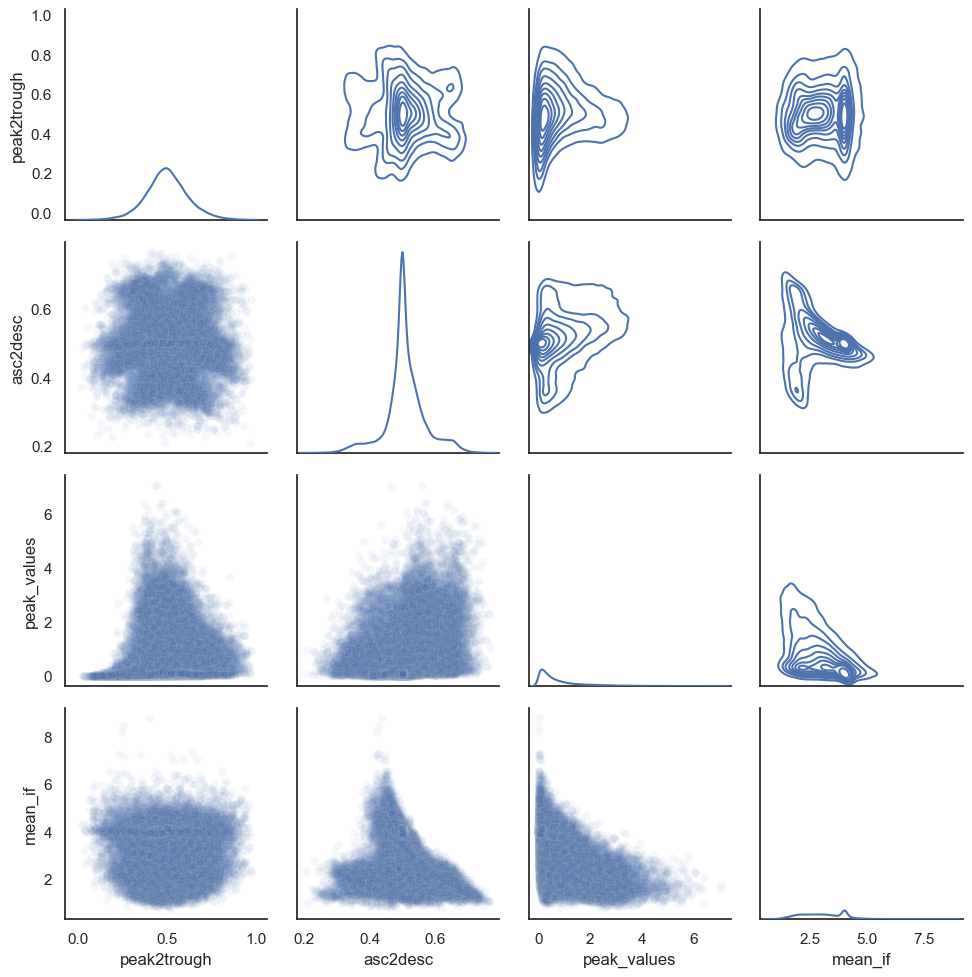

In [218]:
g = sns.PairGrid(Rat_data_pfc_pt5, vars=['peak2trough', 'asc2desc', 'peak_values', 'mean_if'])
g.map_upper(sns.kdeplot)
g.map_lower(sns.scatterplot, alpha=0.05)
g.map_diag(sns.kdeplot)
# g.savefig("./plots/10-02-2025/PFC_Scatter.svg", format="svg", dpi=300)
g.savefig("./plots/10-02-2025/PFC_Scatter.png")

In [219]:
x_limits = []
y_limits = []
for ax in g.axes.flatten():
    if ax is not None:
        x_limits.append(ax.get_xlim())
        y_limits.append(ax.get_ylim())

In [ ]:
g = sns.PairGrid(data[data['region'] == 'HPC'], hue="region")
g.map_upper(sns.kdeplot)
g.map_lower(sns.scatterplot, alpha=0.05)
g.map_diag(sns.kdeplot)
for i, ax in enumerate(g.axes.flatten()):
    if ax is not None and i < len(x_limits):
        ax.set_xlim(x_limits[i])
        ax.set_ylim(y_limits[i])
# g.savefig("./plots/10-02-2025/HPC_Scatter.svg", format="svg", dpi=300)
# g.savefig("./plots/10-02-2025/HPC_Scatter.png")

In [ ]:
# Get UMAP embeddings with default settings
umap_embedder_pfc = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=3, metric='euclidean', random_state=42)
embedding_pfc = umap_embedder_pfc.fit(waveforms_pfc_pt5)
emb_pfc = embedding_pfc.embedding_

In [ ]:
# Get UMAP embeddings with default settings
umap_embedder_hpc = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=3, metric='euclidean', random_state=42)
embedding_hpc = umap_embedder_hpc.fit(waveforms_hpc_pt5)
emb_hpc = embedding_hpc.embedding_

In [ ]:
def get_section(start_sample, section_size=45, fs=2500):
    section_samples = section_size * fs * 60
    section_number = int(start_sample // section_samples) + 1
    return section_number

In [ ]:
metrics_pfc_pt5['section'] = metrics_pfc_pt5['start_sample'].apply(get_section)
metrics_hpc_pt5['section'] = metrics_hpc_pt5['start_sample'].apply(get_section)

In [ ]:
# 3D plot of sleep states projected on UMAP
data = metrics_pfc_pt5
# ['duration_samples', 'peak2trough', 'asc2desc', 'max_amp','trough_values', 'peak_values', 'mean_if', 'max_if', 'range_if']
feature = 'asc2desc'
fig = px.scatter_3d(x=emb_pfc[:,0], y=emb_pfc[:,1], z=emb_pfc[:,2],
              color=data[feature], color_discrete_map=state_color_map)
fig.update_layout(autosize=False,
                 width=800,
                 height=600,
                 scene=Scene(xaxis=XAxis(title='UMAP-1'),
                            yaxis=YAxis(title='UMAP-2'),
                            zaxis=ZAxis(title='UMAP-3')),
                  title=dict(
                        text=f"PFC: Projection of {feature} on UMAP",
                        font=dict(size=20),
                        x=0.5,  # Center the title
                    ),
                 legend_title_text=feature,
)
fig.show()
# fig.write_html(f"./plots/UMAP-ORN-Whole/Rat{rat}/Rat_{rat}_ORN_PFC_embedding_state.html")
# fig.write_image("Rat6_ORN_PFC_3D_embedding.png", engine="kaleido")

# Combine Regions

In [27]:
Rat_data_pfc = pd.read_hdf('./cycles_data/PFC_resampled_cycles_data.h5', f'Rat_{rat}_{condition}')
Rat_data_hpc = pd.read_hdf('./cycles_data/HPC_resampled_cycles_data.h5', f'Rat_{rat}_{condition}')
Rat_data_pfc.insert(20, "region", 'PFC')
Rat_data_hpc.insert(20, "region", 'HPC')
Rat_data = pd.concat([Rat_data_pfc, Rat_data_hpc])
Rat_data = Rat_data[Rat_data['max_amp'] >= np.percentile(Rat_data['max_amp'], 0)]
metrics = Rat_data.iloc[:, :-128]
waveforms = np.array(Rat_data.iloc[:, -128:])

In [64]:
# Get UMAP embeddings with default settings
umap_embedder = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=3, metric='euclidean', random_state=42)
embedding = umap_embedder.fit(waveforms)
emb = embedding.embedding_

C:\Users\u525432\AppData\Roaming\Python\Python312\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



In [65]:
# Section means 45 min of recording
def get_section(start_sample, fs=2500):
    if start_sample/(fs*60) <= 45:
        return 1
    elif start_sample/(fs*60) <= 90:
        return 2
    elif start_sample/(fs*60) <= 135:
        return 3
    return 4

In [66]:
metrics['section'] = metrics['start_sample'].apply(get_section)

In [ ]:
# 3D plot of sleep states projected on UMAP
data = metrics

feature = 'peak_values'
fig = px.scatter_3d(x=emb[:,0], y=emb[:,1], z=emb[:,2],
              color=data[feature], color_discrete_map=state_color_map)
fig.update_layout(autosize=False,
                 width=800,
                 height=600,
                 scene=Scene(xaxis=XAxis(title='UMAP-1'),
                            yaxis=YAxis(title='UMAP-2'),
                            zaxis=ZAxis(title='UMAP-3')),
                  
                 legend_title_text=feature,
)
fig.show()
# fig.write_html(f"./plots/UMAP-ORN-Whole/Rat{rat}/Rat_{rat}_ORN_PFC_embedding_state.html")
# fig.write_image("Rat6_ORN_PFC_3D_embedding.png", engine="kaleido")